# EDA Notebook

In [2]:
import datetime

import numpy as np
import pandas as pd
import plotnine as gg

from CurlingDB import CurlingDB
from utils.PlotnineElements import PlotnineElements as pe, blank

In [3]:
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)

## Things to get
### Plots
- Match summary, plot all of the frames for each end for the whole match
- Stone heatmap
    - Stone heatmap per tournament or per year
- Player accuracy vs number of shots

### Stats
- Player accuracy
- Player accuracy by year, tournament
- Shot type frequency
- Accuracy by shot type
- Shot type frequency by type of shot

### Questions
- Who are the best/most accurate players for certain throws(over 50 or 100) total throws
- Table of players and their accuracy for each type of throw
- For a single player
    - Accuracy for each type of throw
    - Accuracy for each tournament or match they attended
    - Count number of ends for which they player which position


## Create Database Connection

In [7]:
# db = CurlingDB()
db = CurlingDB(db_name='world_curling_ss.db')

## Curling Dimensions

In [5]:
# All values in m
circles = [0.152, 0.610, 1.219, 1.829]
pixel_to_m = 0.007370759
ice_width = [-4.75/2, 4.75/2]
ice_length = [-2, 6.401]
stone_radius = 14.5

# Circle values
inc = np.pi / 16
circle_range_x = np.cos(np.arange(0, 2 * np.pi + inc, inc))
circle_range_y = np.sin(np.arange(0, 2 * np.pi + inc, inc))

# Some Plots

## Stone Position Testing

### Query

In [5]:
stone_position_cmd = """
SELECT x, y, colour, frame_num, m.type,
       CASE WHEN s.size < 47 THEN (CASE WHEN s.colour == 'red' THEN 'pink' WHEN s.colour == 'yellow' THEN 'green' END)
            ELSE s.colour END AS label
FROM Stone s
JOIN Position p
  ON s.position_id = p.position_id
JOIN End e
  ON p.end_id = e.end_id
JOIN Match m
  ON e.match_id = m.match_id
"""
db.execute_query(stone_position_cmd)
all_stone_positions = pd.DataFrame(db.cursor.fetchall(), columns=['x', 'y', 'colour', 'frame_num', 'match_type', 'label'])
print(all_stone_positions.shape)
all_stone_positions.head()

(1053163, 6)


,x,y,colour,frame_num,match_type,label
0,1.757926,1.245658,red,2,Womens_Teams,pink
1,1.761611,1.238288,red,3,Womens_Teams,red
2,0.117932,-1.370961,yellow,3,Womens_Teams,green
3,1.765297,1.238288,red,4,Womens_Teams,red
4,0.644941,0.796042,red,4,Womens_Teams,pink


### Match Type Specific Stones

In [6]:
mens_stones = all_stone_positions.query('match_type == "Mens_Teams"')
print(mens_stones.shape)
womens_stones = all_stone_positions.query('match_type == "Womens_Teams"')
print(womens_stones.shape)
doubles_stones = all_stone_positions.query('match_type == "Mixed_Doubles"')
print(doubles_stones.shape)
para_stones = all_stone_positions.query('match_type == "Mixed_Teams"')
print(para_stones.shape)

(353486, 6)
(327267, 6)
(316801, 6)
(55609, 6)


### Thrown vs. Residual Functions

In [7]:
def thrown_stones(df: pd.DataFrame) -> pd.DataFrame:
    return df.query('(label == "pink") | (label == "green")')

def residual_stones(df: pd.DataFrame) -> pd.DataFrame:
    return df.query('(label == "red") | (label == "yellow")')

def regular(df: pd.DataFrame) -> pd.DataFrame:
    return df.query('(match_type == "Mens_Teams") | (match_type == "Womens_Teams")')

def non_neg_rating(df: pd.DataFrame) -> pd.DataFrame:
    return df.query('rating != -1')

### Filter out the top n most common

In [8]:
top_offenders = all_stone_positions[['x', 'y']].value_counts()[:6]
top_x = top_offenders.index.get_level_values(0)
top_y = top_offenders.index.get_level_values(1)
limited_stones = all_stone_positions.loc[(all_stone_positions.apply(lambda c: c['x'] not in top_x, axis=1) & (all_stone_positions.apply(lambda c: c['y'] not in top_y, axis=1)))]
limited_stones.shape

(985233, 6)

### Create heatmap

#### Women's Heatmap

In [9]:
circle_size = 0.7
circle_colour = 'black'
def stone_heatmap(df, match_type: str=None, size=5):

     if match_type is not None:
          plot_df = df.query('match_type == @match_type')
     else:
          plot_df = df
     
     return (gg.ggplot(plot_df, gg.aes(x='x', y='y'))
          + gg.geom_bin_2d(binwidth=0.2)
          + gg.facet_grid('. ~ frame_num')
          + gg.annotate(geom='path', x=circles[0] * circle_range_x, y=circles[0] * circle_range_y, colour=circle_colour, size=circle_size)
          + gg.annotate(geom='path', x=circles[1] * circle_range_x, y=circles[1] * circle_range_y, colour=circle_colour, size=circle_size)
          + gg.annotate(geom='path', x=circles[2] * circle_range_x, y=circles[2] * circle_range_y, colour=circle_colour, size=circle_size)
          + gg.annotate(geom='path', x=circles[3] * circle_range_x, y=circles[3] * circle_range_y, colour=circle_colour, size=circle_size)

          + gg.scale_x_continuous(limits=ice_width, expand=(0, 0), breaks=lambda x: [0])
          + gg.scale_y_continuous(limits=ice_length, expand=(0, 0), breaks=lambda x: [0])
          # + gg.scale_fill_gradientn(colors=['#000000', '#ff4f00', '#E41C16'], values=[0, 0.3, 1], guide=False)
          # + gg.scale_fill_gradientn(colors=['#333333', '#ff4f00', '#ffD000'], values=[0, 0.3, 1], guide=False)
          # + gg.scale_fill_gradientn(colors=['#fde4cf', '#ffcfd2', '#f1c0e8', '#cfbaf0', '#a3c4f3', '#90dbf4', '#8eecf5', '#98f5e1', '#b9fbc0']) # Original
          # + gg.scale_fill_gradientn(colors=['#ffffff', '#ffcfd2', '#f1c0e8', '#cfbaf0', '#a3c4f3', '#90dbf4', '#8eecf5', '#98f5e1', '#b9fbc0'], values=[0.00, 0.03, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 1])
          # + gg.scale_fill_gradientn(colors=['#ffffff', '#f1c0e8', '#cfbaf0', '#a3c4f3', '#90dbf4', '#8eecf5', '#98f5e1', '#b9fbc0'], values=[0.00, 0.03, 0.08, 0.15, 0.3, 0.4, 0.5, 1], guide=False)  # This is a good one
          # + gg.scale_fill_gradientn(colors=['#ffffff', '#f1c0e8', '#cfbaf0', '#90dbf4', '#98f5e1', '#b9fbc0'], values=[0.00, 0.01, 0.04, 0.14, 0.2, 1], guide=False) # This is also alright
          + gg.scale_fill_gradientn(colors=['#f1c0e8', '#cfbaf0', '#90dbf4', '#98f5e1', '#b1f190'], values=[0.00, 0.04, 0.1, 0.3, 1], guide=False) # This is also alright

          + gg.theme(text=gg.element_text(colour='#ffffff'))
          + gg.theme(axis_text=blank)
          + gg.theme(axis_title=blank)
          + gg.theme(figure_size=(size * (plot_df.frame_num.max() + 1 if match_type == 'Mixed_Doubles' else plot_df.frame_num.max()), size * ((800 + 300)/(600))))

          + pe.background_colour(colour='#ffffff')
          + pe.remove_ticks(minor=True)
          )


### Thrown and All Stones in Men's and Women's Matches

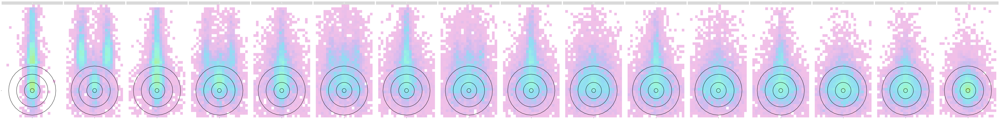

<ggplot: (696058944)>

In [10]:
stone_heatmap(thrown_stones(pd.concat([mens_stones, womens_stones])))

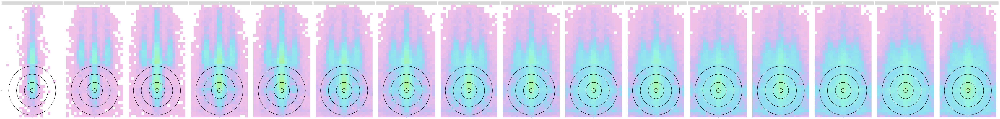

<ggplot: (715349227)>

In [11]:
stone_heatmap(pd.concat([mens_stones, womens_stones]))

### Individual Men's and Women's Heatmaps

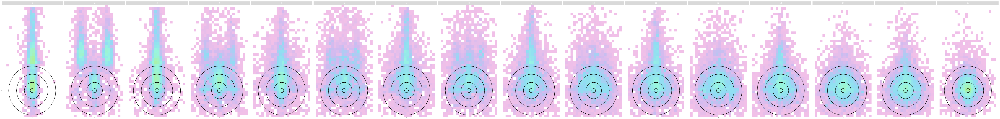

<ggplot: (695839805)>

In [12]:
stone_heatmap(thrown_stones(mens_stones))

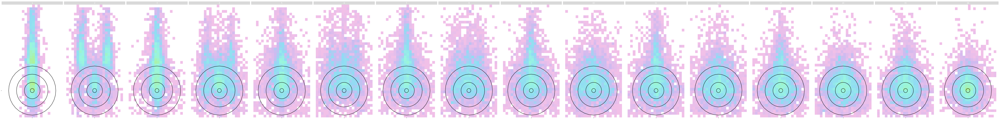

<ggplot: (699095278)>

In [13]:
stone_heatmap(thrown_stones(womens_stones))

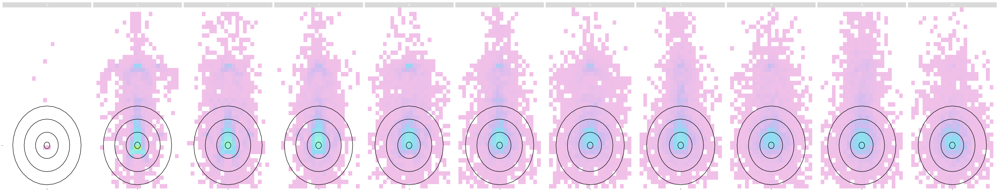

<ggplot: (698652139)>

In [14]:
stone_heatmap(thrown_stones(doubles_stones))

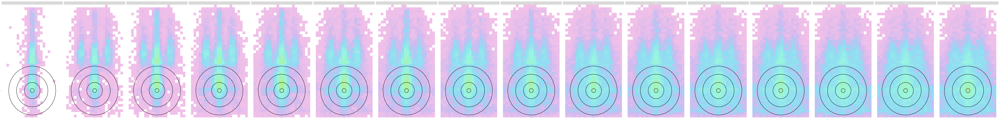

<ggplot: (695945933)>

In [15]:
stone_heatmap(mens_stones)

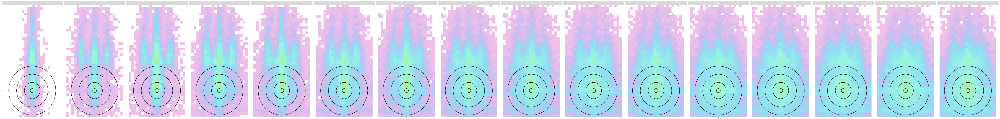

<ggplot: (713546430)>

In [16]:
stone_heatmap(womens_stones)

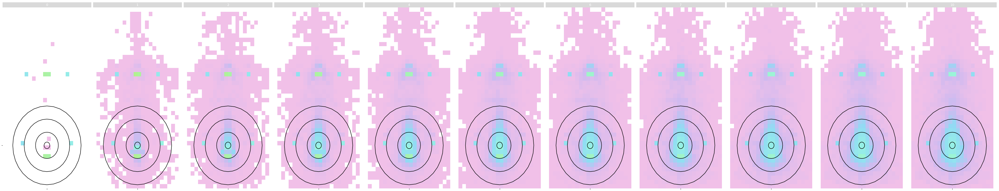

<ggplot: (295383384)>

In [17]:
stone_heatmap(doubles_stones)

## Match Summary
- TODO: Could introduce another query to get match specific, end specific, and frame/throw specific information
    - Include accuracy per team per end
    - Include type of throw per frame
    - Include player
    - Include current score


### Query
- 2093, 2097, 2099, 2100, 2106

In [18]:
match_summary_cmd = """
SELECT m.team_1, m.team_2, e.num, e.hammer_colour, e.direction, p.frame_num, s.x, s.y, 
       s.colour, 
       CASE WHEN s.size < 47 THEN (CASE WHEN s.colour == 'red' THEN 'pink' WHEN s.colour == 'yellow' THEN 'green' END)
            ELSE s.colour END AS label,
       s.size
FROM Stone s
RIGHT JOIN Position p
ON s.position_id = p.position_id
JOIN End e
ON p.end_id = e.end_id
JOIN Match m
ON e.match_id = m.match_id
WHERE m.match_id = ?
"""
db.execute_query(match_summary_cmd, (1,))
# db.execute_query(match_summary_cmd, (9,))
# db.execute_query(match_summary_cmd, (11,))
# db.execute_query(match_summary_cmd, (18,))
# db.execute_query(match_summary_cmd, (32,))
match_summary = pd.DataFrame(db.cursor.fetchall(), columns=['team_1', 'team_2', 'end_num', 'hammer_colour', 'play_direction', 'frame_num', 'x', 'y', 'colour', 'label', 'size'])
print(match_summary.shape)
match_summary.head()

(745, 11)


,team_1,team_2,end_num,hammer_colour,play_direction,frame_num,x,y,colour,label,size
0,NZL,AUS,1,red,down,2,1.757926,1.245658,red,pink,40.0
1,NZL,AUS,1,red,down,3,1.761611,1.238288,red,red,52.0
2,NZL,AUS,1,red,down,3,0.117932,-1.370961,yellow,green,40.0
3,NZL,AUS,1,red,down,4,1.765297,1.238288,red,red,52.0
4,NZL,AUS,1,red,down,4,0.644941,0.796042,red,pink,46.0


In [19]:
thrown_stone = set([tuple(x[:2]) for x in match_summary[['end_num', 'frame_num', 'label']].loc[((match_summary['label'] == 'green') | (match_summary['label'] == 'pink'))].value_counts().sort_index().index.values])
stones_present = set(match_summary[['end_num', 'frame_num']].value_counts().sort_index().index.values)
thrown_stone.symmetric_difference(stones_present);


### Match Heatmap

/Users/lucasnieuwenhout/miniforge3/envs/env_curling/lib/python3.9/site-packages/plotnine/layer.py:411: PlotnineWarning: geom_point : Removed 18 rows containing missing values.


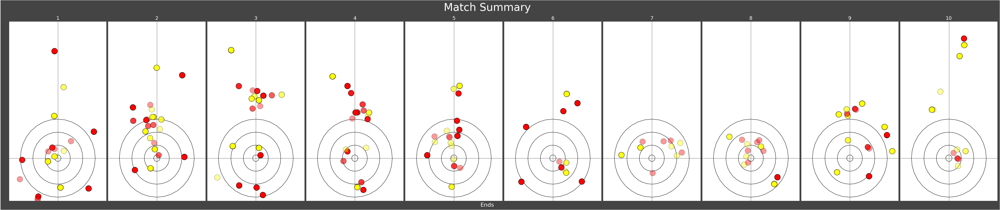

<ggplot: (702090981)>

In [20]:
size = 5
(gg.ggplot(match_summary, gg.aes(x='x', y='y', fill='colour'))
    + gg.annotate(geom='path', x=circles[0] * circle_range_x, y=circles[0] * circle_range_y)
    + gg.annotate(geom='path', x=circles[1] * circle_range_x, y=circles[1] * circle_range_y)
    + gg.annotate(geom='path', x=circles[2] * circle_range_x, y=circles[2] * circle_range_y)
    + gg.annotate(geom='path', x=circles[3] * circle_range_x, y=circles[3] * circle_range_y)
    + gg.geom_point(alpha = 0.4, size=8.5)

    + gg.facet_grid('. ~ end_num')

    + gg.scale_x_continuous(limits=ice_width, expand=(0, 0), breaks=lambda x: [0])
    + gg.scale_y_continuous(limits=ice_length, expand=(0, 0), breaks=lambda x: [0])
    + gg.scale_fill_manual(values=['red', 'yellow'], guide=False)

    + gg.theme(figure_size=(size * (match_summary.end_num.max()), size * ((800 + 300)/(600))))
    + gg.theme(panel_grid=gg.element_line(colour='gray'))
    + gg.theme(text=gg.element_text(colour='white'))
    + gg.theme(axis_text=blank)
    + gg.theme(strip_text=gg.element_text(size=14), strip_background=blank)

    + pe.background_colour(panel_colour='#FFFFFF', plot_colour='#444444')
    + pe.remove_grid(minor=True)
    + pe.remove_ticks(minor=True, major=True)
    + pe.labels(title='Match Summary', x='Ends', y=' ', title_size=30, x_size=16, y_size=16)
    )

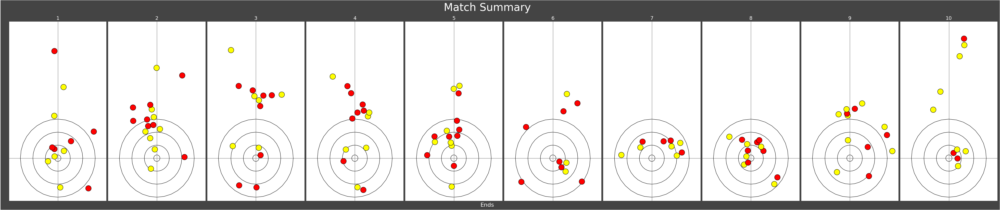

<ggplot: (702810329)>

In [21]:
(gg.ggplot(thrown_stones(match_summary), gg.aes(x='x', y='y', fill='colour'))
    + gg.annotate(geom='path', x=circles[0] * circle_range_x, y=circles[0] * circle_range_y)
    + gg.annotate(geom='path', x=circles[1] * circle_range_x, y=circles[1] * circle_range_y)
    + gg.annotate(geom='path', x=circles[2] * circle_range_x, y=circles[2] * circle_range_y)
    + gg.annotate(geom='path', x=circles[3] * circle_range_x, y=circles[3] * circle_range_y)
    + gg.geom_point(size=8.5)

    + gg.facet_grid('. ~ end_num')

    + gg.scale_x_continuous(limits=ice_width, expand=(0, 0), breaks=lambda x: [0])
    + gg.scale_y_continuous(limits=ice_length, expand=(0, 0), breaks=lambda x: [0])
    + gg.scale_fill_manual(values=['red', 'yellow'], guide=False)

    + gg.theme(figure_size=(size * (match_summary.end_num.max()), size * ((800 + 300)/(600))))
    + gg.theme(panel_grid=gg.element_line(colour='gray'))
    + gg.theme(text=gg.element_text(colour='white'))
    + gg.theme(axis_text=blank)
    + gg.theme(strip_text=gg.element_text(size=14), strip_background=blank)

    + pe.background_colour(panel_colour='#FFFFFF', plot_colour='#444444')
    + pe.remove_grid(minor=True)
    + pe.remove_ticks(minor=True, major=True)
    + pe.labels(title='Match Summary', x='Ends', y=' ', title_size=30, x_size=16, y_size=16)
    )

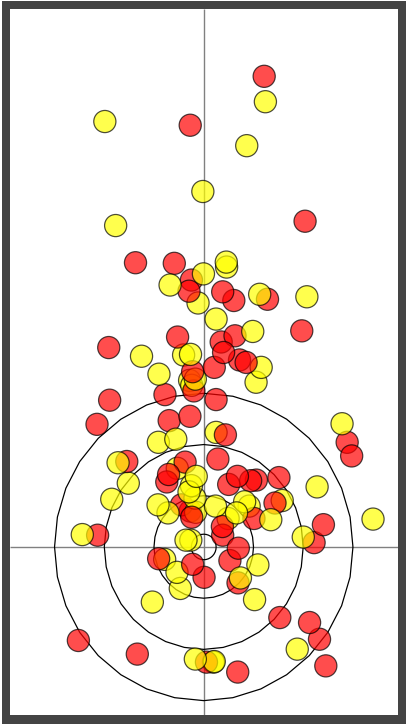

<ggplot: (698952367)>

In [22]:
(gg.ggplot(thrown_stones(match_summary), gg.aes(x='x', y='y', fill='colour'))
    + gg.annotate(geom='path', x=circles[0] * circle_range_x, y=circles[0] * circle_range_y)
    + gg.annotate(geom='path', x=circles[1] * circle_range_x, y=circles[1] * circle_range_y)
    + gg.annotate(geom='path', x=circles[2] * circle_range_x, y=circles[2] * circle_range_y)
    + gg.annotate(geom='path', x=circles[3] * circle_range_x, y=circles[3] * circle_range_y)

    + gg.geom_point(alpha=0.7, size=8.5)

    + gg.scale_x_continuous(limits=ice_width, expand=(0, 0), breaks=lambda x: [0])
    + gg.scale_y_continuous(limits=ice_length, expand=(0, 0), breaks=lambda x: [0])
    + gg.scale_fill_manual(values=['red', 'yellow'], guide=False)

    + gg.theme(figure_size=(size, size * ((800 + 300)/(600))))
    + gg.theme(panel_grid=gg.element_line(colour='gray'))
    + gg.theme(text=gg.element_text(colour='white'))
    + gg.theme(axis_text=blank, axis_title_x=blank, axis_title_y=blank, title=gg.element_text('Match Stone Locations'))
    + gg.theme(strip_text=gg.element_text(size=14), strip_background=blank)

    + pe.background_colour(panel_colour='#FFFFFF', plot_colour='#444444')
    + pe.remove_grid(minor=True)
    + pe.remove_ticks(minor=True, major=True)
    )

### Plot

/Users/lucasnieuwenhout/miniforge3/envs/env_curling/lib/python3.9/site-packages/plotnine/layer.py:411: PlotnineWarning: geom_point : Removed 18 rows containing missing values.


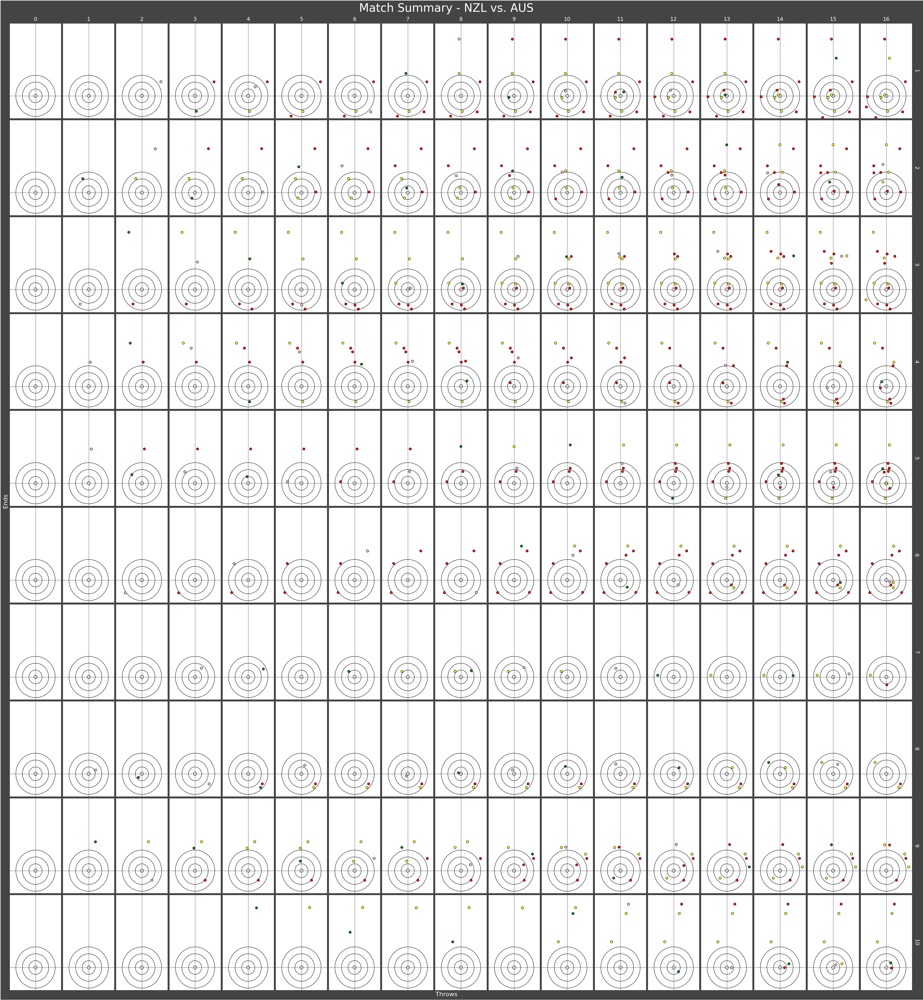

<ggplot: (696243273)>

In [23]:
size = 2.5
(gg.ggplot(match_summary, gg.aes(x='x', y='y', fill='label'))
    + gg.annotate(geom='path', x=circles[0] * circle_range_x, y=circles[0] * circle_range_y)
    + gg.annotate(geom='path', x=circles[1] * circle_range_x, y=circles[1] * circle_range_y)
    + gg.annotate(geom='path', x=circles[2] * circle_range_x, y=circles[2] * circle_range_y)
    + gg.annotate(geom='path', x=circles[3] * circle_range_x, y=circles[3] * circle_range_y)
    + gg.geom_point(size=3)

    + gg.facet_grid('end_num ~ frame_num', space='free')

    + gg.scale_x_continuous(limits=ice_width, expand=(0, 0), breaks=lambda x: [0])
    + gg.scale_y_continuous(limits=ice_length, expand=(0, 0), breaks=lambda x: [0])
    + gg.scale_fill_manual(values=['green', 'pink', 'red', 'yellow'], guide=False)
    + gg.theme(figure_size=(size * (match_summary['frame_num'].max() + 1), size * (match_summary['end_num'].max()) * ((800 + 300)/(600))))
    + gg.theme(panel_grid=gg.element_line(colour='gray'))
    + gg.theme(text=gg.element_text(colour='white'))
    + gg.theme(axis_text=blank)
    + gg.theme(strip_text=gg.element_text(size=14), strip_background=blank, legend_background=gg.element_rect('#444444'))

    + pe.background_colour(panel_colour='#FFFFFF', plot_colour='#444444')
    + pe.remove_grid(minor=True)
    + pe.remove_ticks(minor=True, major=True)
    + pe.labels(title=f'Match Summary - {match_summary.team_1[0]} vs. {match_summary.team_2[0]}', x='Throws', y='Ends', title_size=30, x_size=16, y_size=16)
    )

## Linking Throws and Positions for Rating per Throw Type

### Query

In [8]:
# Get each throw along with the count of stones
linking_cmd = """
SELECT frames.position_id, frames.type, frames.num, frames.frame_num, frames.coun, throws.colour, throws.name, throws.team, throws.sex, throws.type, throws.rating
FROM
(SELECT p.frame_num, 
        e1.num,
        p.position_id,
        e1.end_id,
        m1.type,
        COUNT(*) as coun
FROM Stone s
JOIN Position p
  ON s.position_id = p.position_id
JOIN End e1
  ON p.end_id = e1.end_id
JOIN Match m1
  ON e1.match_id = m1.match_id
JOIN Event e2
  ON m1.event_id = e2.event_id
GROUP BY 3
) frames
LEFT JOIN
(SELECT t.throw_num, 
        t.colour, 
        p.name, 
        p.team, 
        p.sex,
        t.type, 
        t.rating, 
        e1.num,
        e1.end_id
FROM Throw t
JOIN Player p
  ON t.player_id = p.player_id
JOIN End e1
  ON t.end_id = e1.end_id
JOIN Match m1
  ON e1.match_id = m1.match_id
JOIN Event e2
  ON m1.event_id = e2.event_id
) throws
  ON frames.frame_num = throws.throw_num AND frames.end_id = throws.end_id

"""
db.execute_query(linking_cmd)
# linking = pd.DataFrame(db.cursor.fetchall(), columns=['team_1', 'team_2', 'end_num', 'hammer_colour', 'play_direction', 'frame_num', 'rating', 'x', 'y', 'colour'])
linking = pd.DataFrame(db.cursor.fetchall(), columns=['position_id', 'match_type', 'end_num', 'throw_num', 'stone_count', 'colour', 'name', 'team', 'sex', 'type', 'rating'])
print(linking.shape)
linking.head()

(254743, 11)


,position_id,match_type,end_num,throw_num,stone_count,colour,name,team,sex,type,rating
0,3,Womens_Teams,1,2,1,red,THOMPSON H,NZL,f,Front,2.0
1,4,Womens_Teams,1,3,2,yellow,FREDERICKS ARMSTR.,AUS,f,Draw,3.0
2,5,Womens_Teams,1,4,3,red,THOMPSON H,NZL,f,Draw,4.0
3,6,Womens_Teams,1,5,3,yellow,POWELL A,AUS,f,Take-out,2.0
4,7,Womens_Teams,1,6,4,red,JEYARANJAN T,NZL,f,Draw,0.0


In [25]:
linking_reg = regular(linking)
linking_reg.shape

(178552, 11)

### Exploratory Plots

#### Throw Number

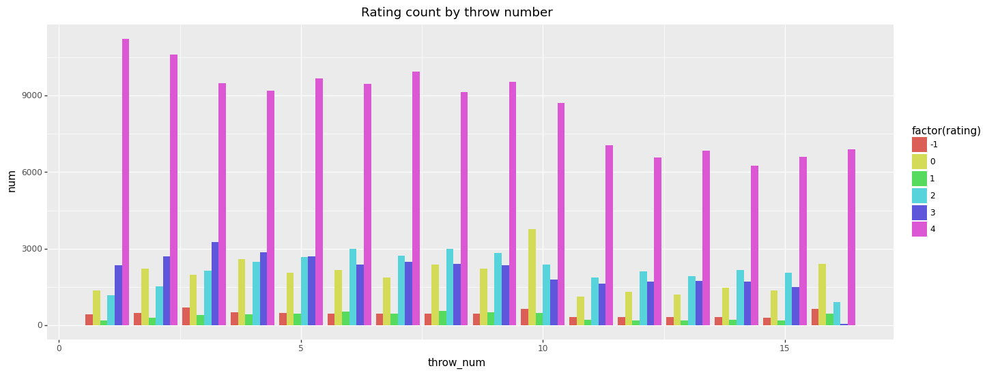

<ggplot: (710268950)>

In [26]:
(gg.ggplot(pd.DataFrame(linking[['throw_num', 'rating']].value_counts().sort_index()).reset_index().rename(columns={0:'num'}), gg.aes(x='throw_num', y='num', fill='factor(rating)')) 
    + gg.geom_col(position='dodge') 
    + gg.theme(figure_size=(16, 6)) 
    + pe.labels(title='Rating count by throw number'))

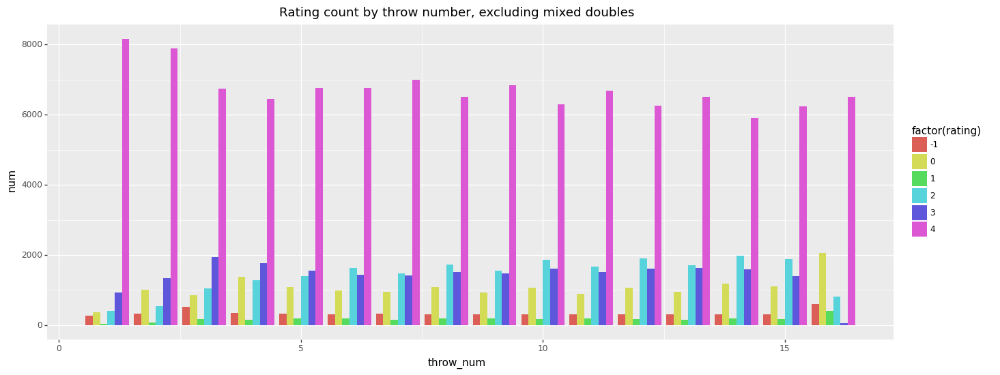

<ggplot: (706128610)>

In [27]:
(gg.ggplot(pd.DataFrame(linking_reg[['throw_num', 'rating']].value_counts().sort_index()).reset_index().rename(columns={0:'num'}), gg.aes(x='throw_num', y='num', fill='factor(rating)')) 
    + gg.geom_col(position='dodge') 
    + gg.theme(figure_size=(16, 6)) 
    + pe.labels(title='Rating count by throw number, excluding mixed doubles'))

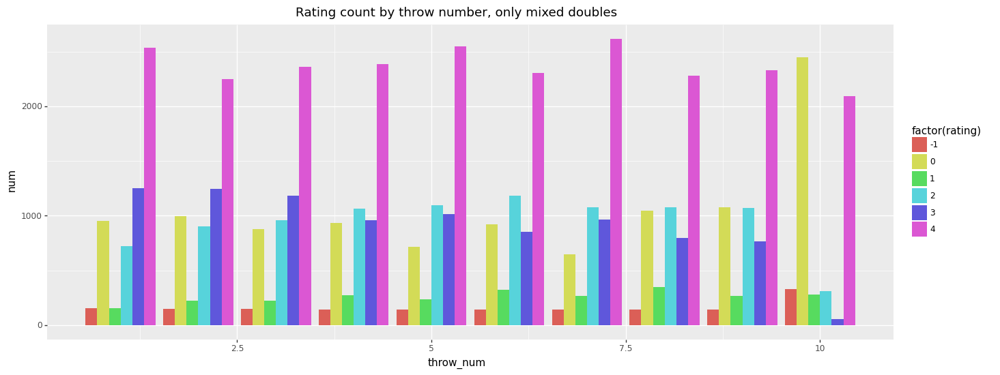

<ggplot: (699436572)>

In [28]:
(gg.ggplot(pd.DataFrame(linking.query('match_type == "Mixed_Doubles"')[['throw_num', 'rating']].value_counts().sort_index()).reset_index().rename(columns={0:'num'}), gg.aes(x='throw_num', y='num', fill='factor(rating)')) 
    + gg.geom_col(position='dodge') 
    + gg.theme(figure_size=(16, 6)) 
    + pe.labels(title='Rating count by throw number, only mixed doubles'))

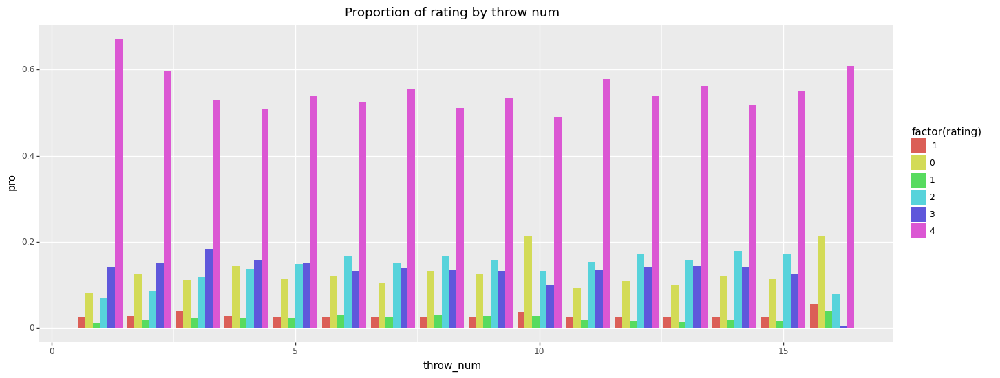

<ggplot: (695855101)>

In [29]:
df = pd.DataFrame(linking[['throw_num', 'rating']].value_counts().sort_index()).reset_index().rename(columns={0:'num'})
df['pro'] = df.apply(lambda x: x['num'] / df.loc[df['throw_num'] == x['throw_num'], 'num'].sum(), axis=1)
(gg.ggplot(df, gg.aes(x='throw_num', y='pro', fill='factor(rating)')) 
    + gg.geom_col(position='dodge') 
    + gg.theme(figure_size=(16, 6)) 
    + pe.labels(title='Proportion of rating by throw num'))

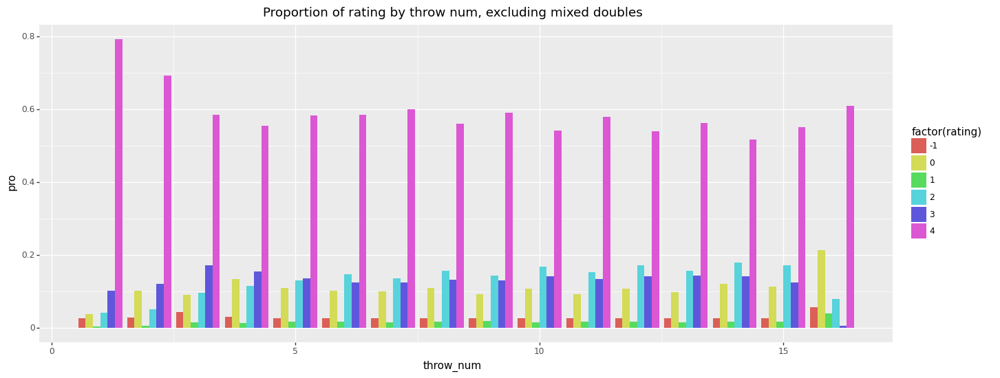

<ggplot: (699753153)>

In [30]:
df = pd.DataFrame(linking.query('match_type != "Mixed_Doubles"')[['throw_num', 'rating']].value_counts().sort_index()).reset_index().rename(columns={0:'num'})
df['pro'] = df.apply(lambda x: x['num'] / df.loc[df['throw_num'] == x['throw_num'], 'num'].sum(), axis=1)
(gg.ggplot(df, gg.aes(x='throw_num', y='pro', fill='factor(rating)')) 
    + gg.geom_col(position='dodge') 
    + gg.theme(figure_size=(16, 6)) 
    + pe.labels(title='Proportion of rating by throw num, excluding mixed doubles'))

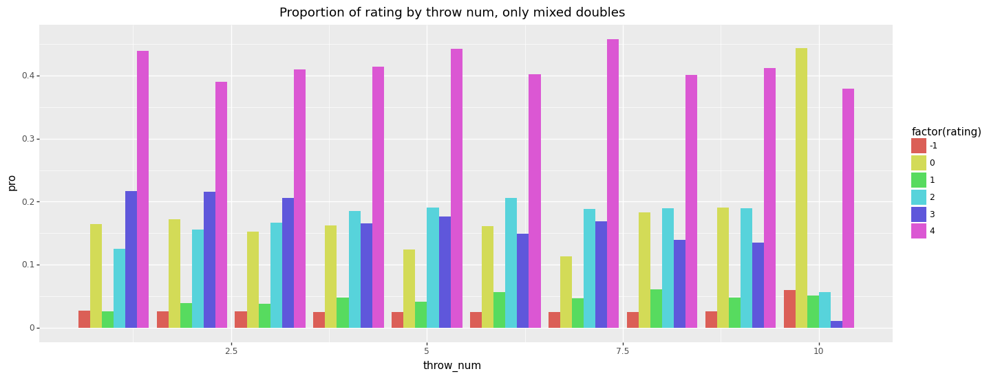

<ggplot: (709584674)>

In [31]:
df = pd.DataFrame(linking.query('match_type == "Mixed_Doubles"')[['throw_num', 'rating']].value_counts().sort_index()).reset_index().rename(columns={0:'num'})
df['pro'] = df.apply(lambda x: x['num'] / df.loc[df['throw_num'] == x['throw_num'], 'num'].sum(), axis=1)
(gg.ggplot(df, gg.aes(x='throw_num', y='pro', fill='factor(rating)')) 
    + gg.geom_col(position='dodge') 
    + gg.theme(figure_size=(16, 6)) 
    + pe.labels(title='Proportion of rating by throw num, only mixed doubles'))

#### Stone Count

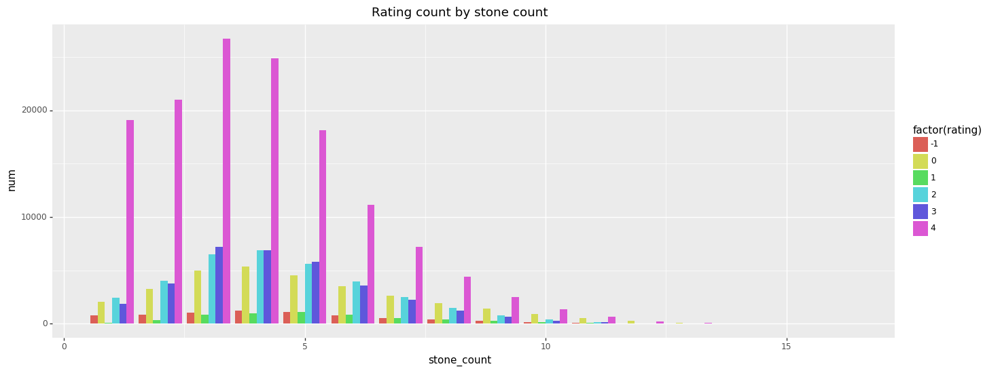

<ggplot: (711739817)>

In [32]:
(gg.ggplot(pd.DataFrame(linking[['stone_count', 'rating']].value_counts().sort_index()).reset_index().rename(columns={0:'num'}), gg.aes(x='stone_count', y='num', fill='factor(rating)')) 
    + gg.geom_col(position='dodge') 
    + gg.theme(figure_size=(16, 6)) 
    + pe.labels(title='Rating count by stone count'))

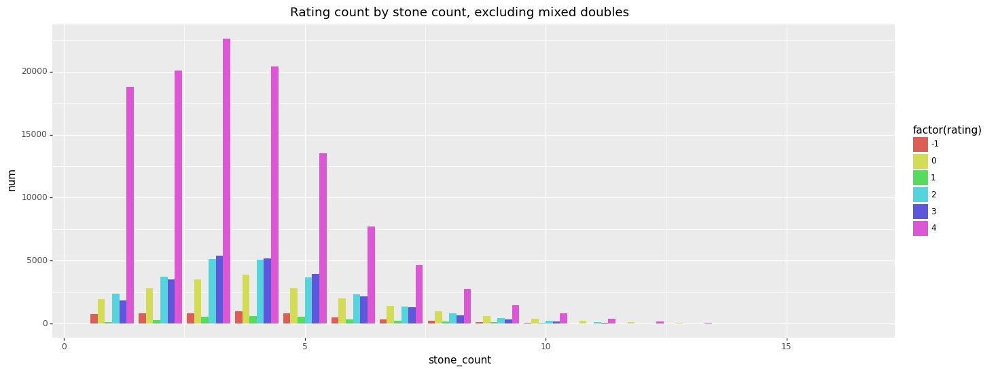

<ggplot: (701592004)>

In [33]:
(gg.ggplot(pd.DataFrame(linking.query('match_type != "Mixed_Doubles"')[['stone_count', 'rating']].value_counts().sort_index()).reset_index().rename(columns={0:'num'}), gg.aes(x='stone_count', y='num', fill='factor(rating)')) 
    + gg.geom_col(position='dodge') 
    + gg.theme(figure_size=(16, 6)) 
    + pe.labels(title='Rating count by stone count, excluding mixed doubles'))

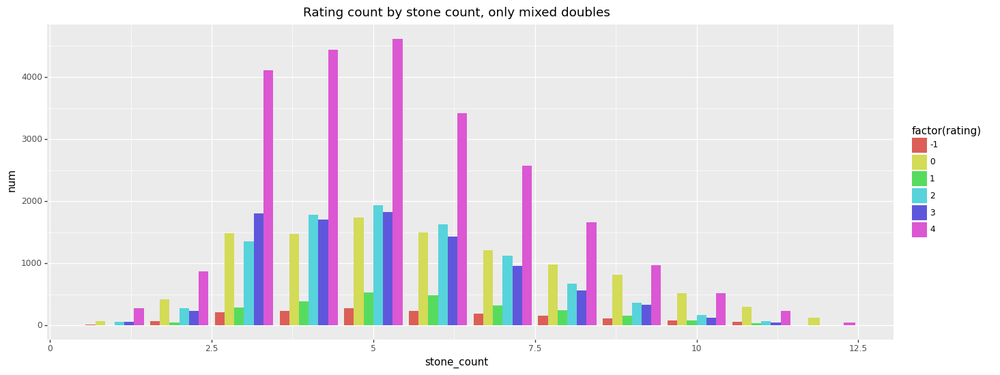

<ggplot: (715056162)>

In [34]:
(gg.ggplot(pd.DataFrame(linking.query('match_type == "Mixed_Doubles"')[['stone_count', 'rating']].value_counts().sort_index()).reset_index().rename(columns={0:'num'}), gg.aes(x='stone_count', y='num', fill='factor(rating)')) 
    + gg.geom_col(position='dodge') 
    + gg.theme(figure_size=(16, 6)) 
    + pe.labels(title='Rating count by stone count, only mixed doubles'))

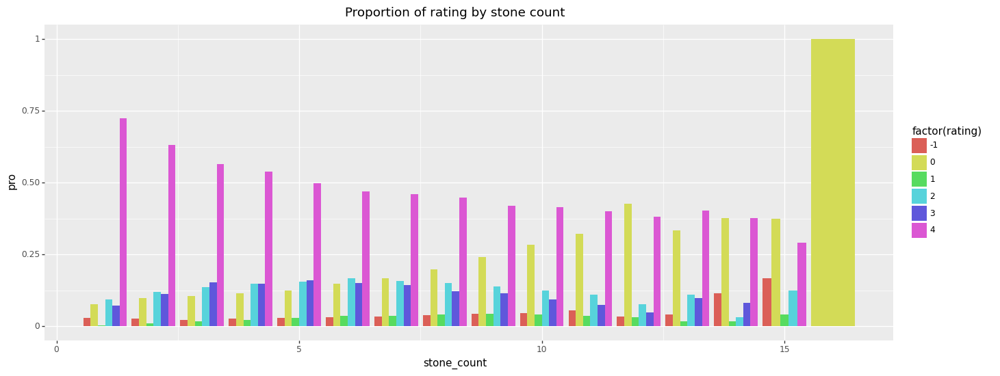

<ggplot: (704508302)>

In [35]:
df = pd.DataFrame(linking[['stone_count', 'rating']].value_counts().sort_index()).reset_index().rename(columns={0:'num'})
df['pro'] = df.apply(lambda x: x['num'] / df.loc[df['stone_count'] == x['stone_count'], 'num'].sum(), axis=1)
(gg.ggplot(df, gg.aes(x='stone_count', y='pro', fill='factor(rating)')) 
    + gg.geom_col(position='dodge') 
    + gg.theme(figure_size=(16, 6)) 
    + pe.labels(title='Proportion of rating by stone count'))

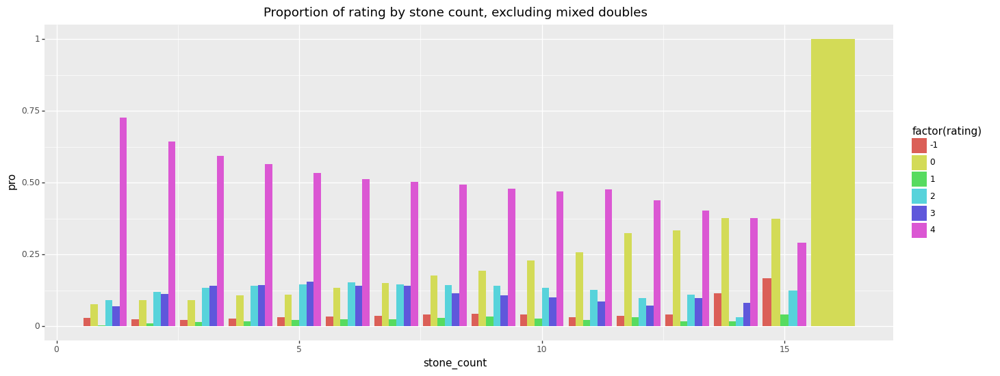

<ggplot: (704663516)>

In [36]:
df = pd.DataFrame(linking.query('match_type != "Mixed_Doubles"')[['stone_count', 'rating']].value_counts().sort_index()).reset_index().rename(columns={0:'num'})
df['pro'] = df.apply(lambda x: x['num'] / df.loc[df['stone_count'] == x['stone_count'], 'num'].sum(), axis=1)
(gg.ggplot(df, gg.aes(x='stone_count', y='pro', fill='factor(rating)')) 
    + gg.geom_col(position='dodge') 
    + gg.theme(figure_size=(16, 6)) 
    + pe.labels(title='Proportion of rating by stone count, excluding mixed doubles'))

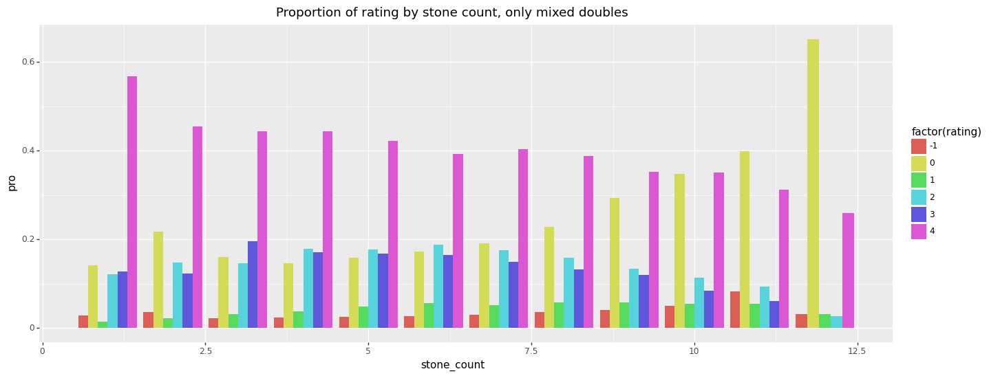

<ggplot: (717212290)>

In [37]:
df = pd.DataFrame(linking.query('match_type == "Mixed_Doubles"')[['stone_count', 'rating']].value_counts().sort_index()).reset_index().rename(columns={0:'num'})
df['pro'] = df.apply(lambda x: x['num'] / df.loc[df['stone_count'] == x['stone_count'], 'num'].sum(), axis=1)
(gg.ggplot(df, gg.aes(x='stone_count', y='pro', fill='factor(rating)')) 
    + gg.geom_col(position='dodge') 
    + gg.theme(figure_size=(16, 6)) 
    + pe.labels(title='Proportion of rating by stone count, only mixed doubles'))

#### Summary

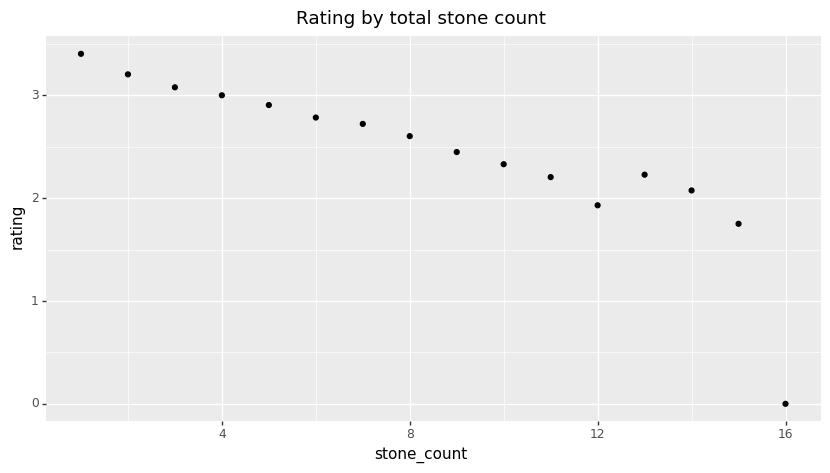

<ggplot: (276002241)>

In [9]:
(gg.ggplot(linking.query('rating != -1').groupby(['stone_count']).agg({'rating': 'mean'}).reset_index(), gg.aes(x='stone_count', y='rating')) 
    + gg.geom_point() 
    + pe.labels(title='Rating by total stone count')
    + gg.theme(figure_size=(10, 5))
    )

I suspect that the decline in rating here

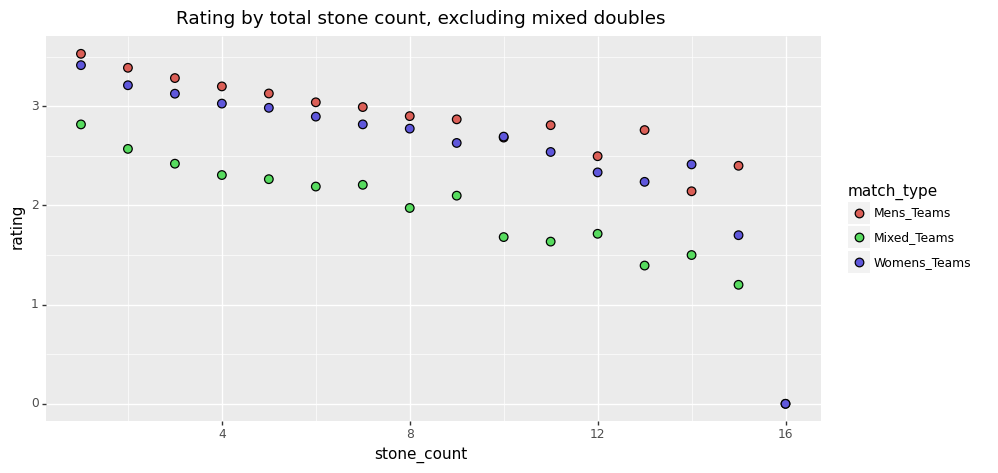

<ggplot: (688587005)>

In [14]:
(gg.ggplot(linking.query('(rating != -1)  & (match_type != "Mixed_Doubles")').groupby(['match_type', 'stone_count']).agg({'rating': 'mean'}).reset_index(), gg.aes(x='stone_count', y='rating', fill='match_type')) 
    + gg.geom_point(size=3) 
    + pe.labels(title='Rating by total stone count, excluding mixed doubles')
    + gg.theme(figure_size=(10, 5))
    )

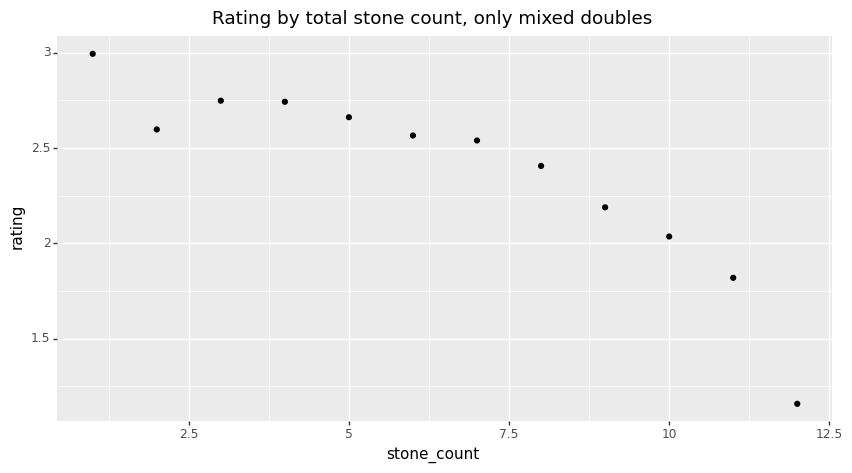

<ggplot: (705216642)>

In [40]:
(gg.ggplot(linking.query('(rating != -1)  & (match_type == "Mixed_Doubles")').groupby(['stone_count']).agg({'rating': 'mean'}).reset_index(), gg.aes(x='stone_count', y='rating')) 
    + gg.geom_point() 
    + pe.labels(title='Rating by total stone count, only mixed doubles')
    + gg.theme(figure_size=(10, 5))
    )

In [41]:
linking.query('rating != -1').groupby(['sex']).agg({'rating': 'mean'}).reset_index()

,sex,rating
0,f,3.052842
1,m,3.195360
2,u,2.455373


In [42]:
linking.query('rating != -1').groupby(['match_type', 'sex']).agg({'rating': 'mean'}).reset_index()

,match_type,sex,rating
0,Mens_Teams,f,3.237569
1,Mens_Teams,m,3.238363
2,Mixed_Doubles,f,2.741944
3,Mixed_Doubles,m,2.858599
4,Mixed_Doubles,u,2.476844
5,Mixed_Teams,f,2.841808
6,Mixed_Teams,m,2.235294
7,Mixed_Teams,u,2.399719
8,Womens_Teams,f,3.081257
9,Womens_Teams,m,3.053797


/Users/lucasnieuwenhout/miniforge3/envs/env_curling/lib/python3.9/site-packages/plotnine/geoms/geom_path.py:75: PlotnineWarning: geom_path: Removed 1 rows containing missing values.


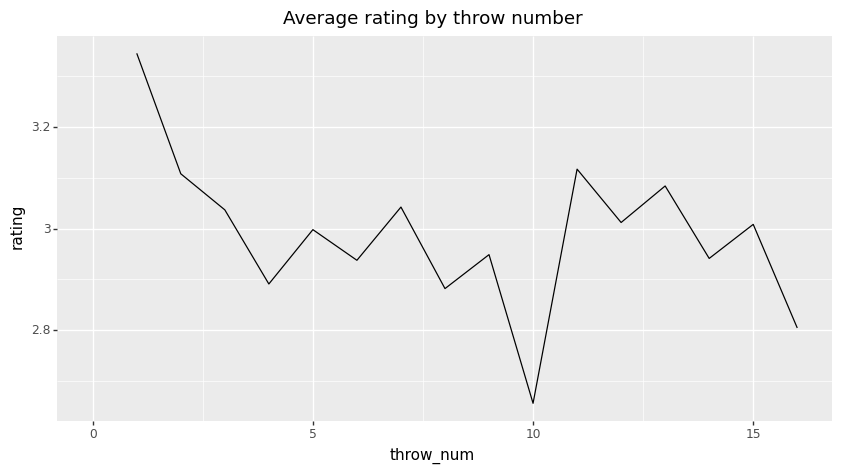

<ggplot: (707512902)>

In [43]:
(gg.ggplot(linking.query('rating != -1').groupby(['throw_num']).agg({'rating': 'mean'}).reset_index(), gg.aes(x='throw_num', y='rating')) 
    + gg.geom_line() 
    + pe.labels(title='Average rating by throw number')
    + gg.theme(figure_size=(10, 5))
    )

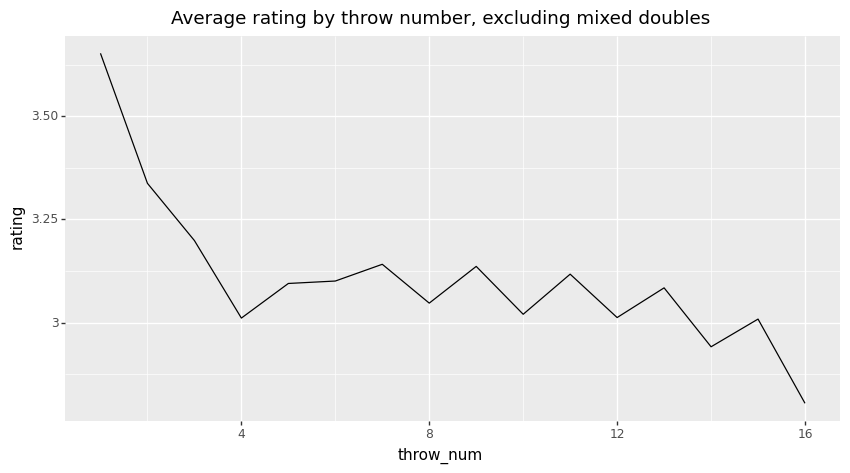

<ggplot: (707302075)>

In [44]:
(gg.ggplot(linking.query('(rating != -1) & (match_type != "Mixed_Doubles")').groupby(['throw_num']).agg({'rating': 'mean'}).reset_index(), gg.aes(x='throw_num', y='rating')) 
    + gg.geom_line() 
    + pe.labels(title='Average rating by throw number, excluding mixed doubles')
    + gg.theme(figure_size=(10, 5))
    )

/Users/lucasnieuwenhout/miniforge3/envs/env_curling/lib/python3.9/site-packages/plotnine/geoms/geom_path.py:75: PlotnineWarning: geom_path: Removed 1 rows containing missing values.


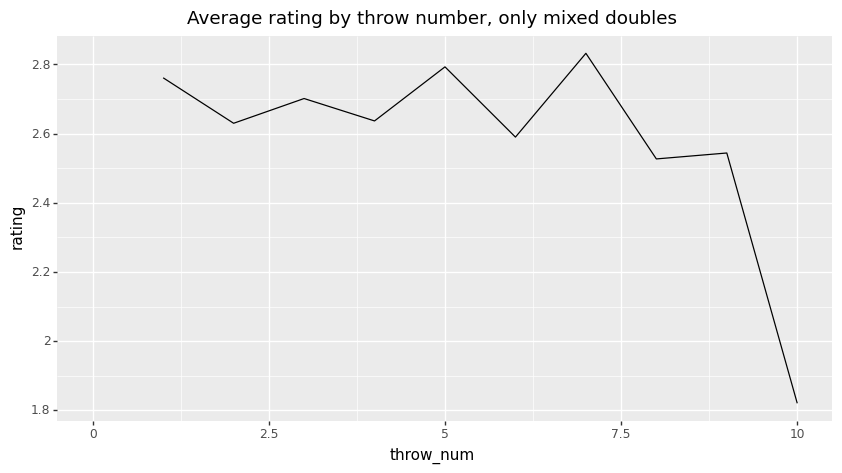

<ggplot: (707299006)>

In [45]:
(gg.ggplot(linking.query('(rating != -1) & (match_type == "Mixed_Doubles")').groupby(['throw_num']).agg({'rating': 'mean'}).reset_index(), gg.aes(x='throw_num', y='rating')) 
    + gg.geom_line() 
    + pe.labels(title='Average rating by throw number, only mixed doubles')
    + gg.theme(figure_size=(10, 5))
    )

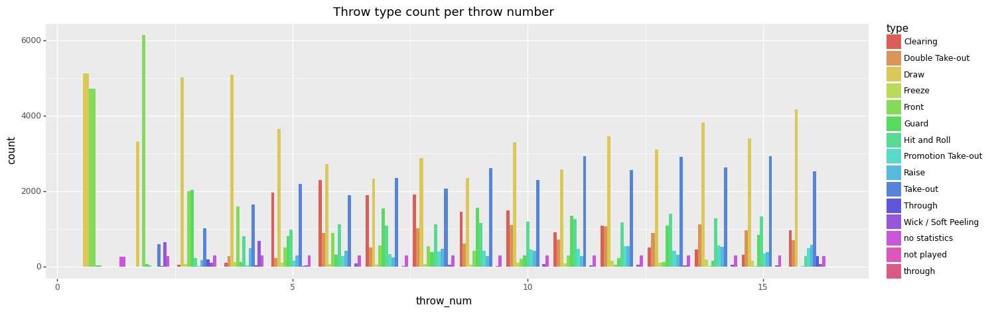

<ggplot: (708753077)>

In [46]:
# Throw count for the given throw count or number of stones
(gg.ggplot(linking_reg.dropna(), gg.aes(x='throw_num', fill='type')) 
     + gg.geom_bar(position='dodge') 
     + gg.theme(figure_size=(16, 5)) 
     + pe.labels(title='Throw type count per throw number'))

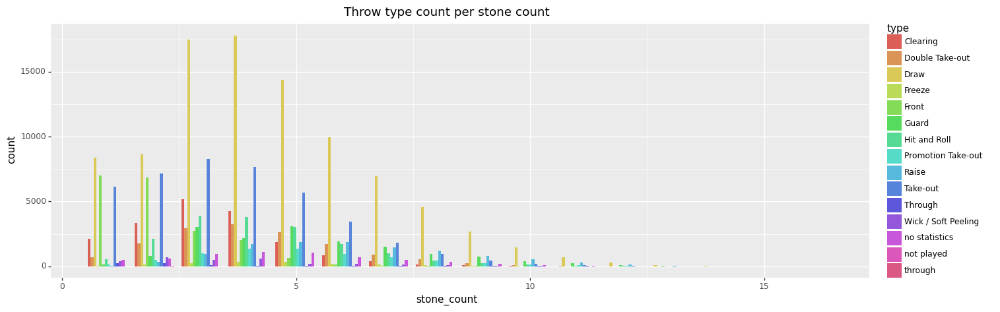

<ggplot: (708784056)>

In [47]:
(gg.ggplot(linking.dropna(), gg.aes(x='stone_count', fill='type')) 
    + gg.geom_bar(position='dodge') 
    + gg.theme(figure_size=(16, 5)) 
    + pe.labels(title='Throw type count per stone count'))

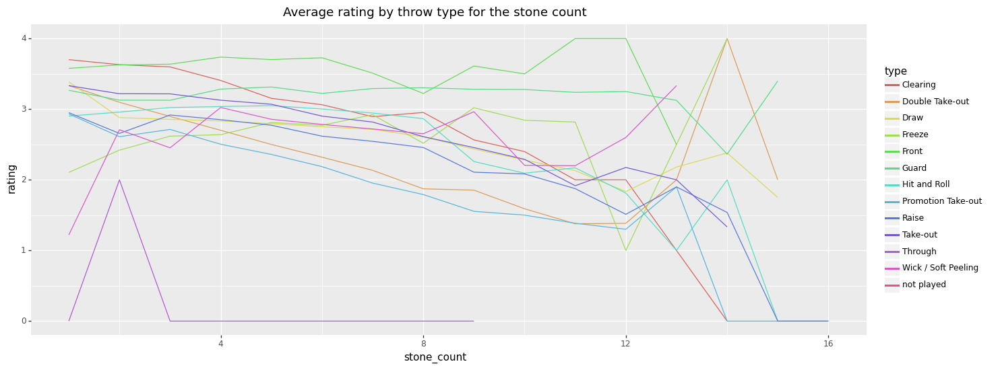

<ggplot: (708956922)>

In [48]:
(gg.ggplot(linking.query('rating != -1').groupby(['type', 'stone_count']).agg({'rating': 'mean'}).reset_index(), gg.aes(x='stone_count', y='rating', colour='type')) 
    + gg.geom_line() 
    + gg.theme(figure_size=(16, 6)) 
    + pe.labels(title='Average rating by throw type for the stone count'))

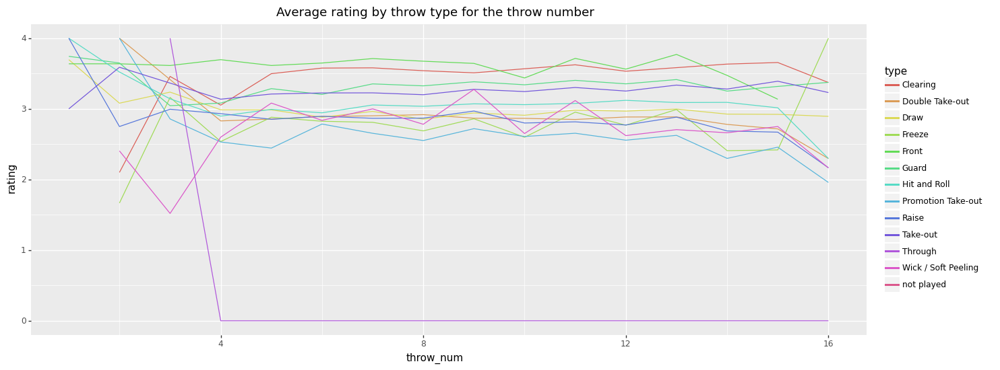

<ggplot: (710583926)>

In [49]:
(gg.ggplot(linking_reg.query('rating != -1').groupby(['type', 'throw_num']).agg({'rating': 'mean'}).reset_index(), gg.aes(x='throw_num', y='rating', colour='type')) 
    + gg.geom_line() 
    + gg.theme(figure_size=(16, 6))
    + pe.labels(title='Average rating by throw type for the throw number'))

## Player Accuracy

### Query

In [50]:
player_cmd = """
SELECT p.name, 
       p.team, 
       p.sex, 
       t.throw_num, 
       t.type, 
       t.rating, 
       e.hammer_colour, 
       DATE(m.start_time), 
       m.type, 
       e1.abbrev
FROM Throw t
JOIN Player p
  ON t.player_id = p.player_id
JOIN End e
  ON t.end_id = e.end_id
JOIN Match m
  ON e.match_id = m.match_id
JOIN Event e1
  ON m.event_id = e1.event_id
"""
db.execute_query(player_cmd)
players = pd.DataFrame(db.cursor.fetchall(), columns=['name', 'team', 'sex', 'throw_num', 'throw_type', 'rating', 'hammer_colour', 'date', 'match_type', 'event'])
players['country'] = players.apply(lambda x: x['team'][:3], axis=1)
print(players.shape)
players.head()

(255097, 11)


,name,team,sex,throw_num,throw_type,rating,hammer_colour,date,match_type,event,country
0,FREDERICKS ARMSTR.,AUS,f,1,Draw,0.0,red,2017-11-04,Womens_Teams,CUR_PACC2017B,AUS
1,THOMPSON H,NZL,f,2,Front,2.0,red,2017-11-04,Womens_Teams,CUR_PACC2017B,NZL
2,FREDERICKS ARMSTR.,AUS,f,3,Draw,3.0,red,2017-11-04,Womens_Teams,CUR_PACC2017B,AUS
3,THOMPSON H,NZL,f,4,Draw,4.0,red,2017-11-04,Womens_Teams,CUR_PACC2017B,NZL
4,POWELL A,AUS,f,5,Take-out,2.0,red,2017-11-04,Womens_Teams,CUR_PACC2017B,AUS


### Top rated players with over 50 throws

In [51]:
player_ratings = players.groupby(['name', 'team', 'sex']).agg({'rating':[('mean', 'mean'), ('count', 'count')]})
player_ratings.columns = ['_'.join(col) for col in player_ratings.columns.values]
player_ratings = player_ratings.dropna().reset_index()
player_ratings.query('rating_count > 50').sort_values('rating_mean', ascending=False).reset_index().query('name == "MARKS A"').head(30)

,index,name,team,sex,rating_mean,rating_count
275,508,MARKS A,CAN,f,3.081633,98


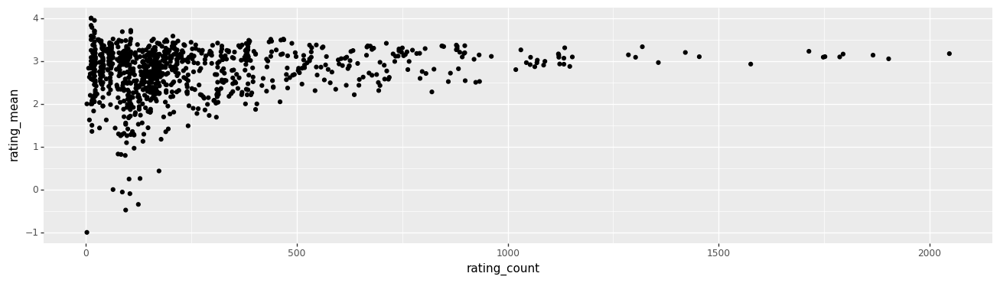

<ggplot: (715009344)>

In [52]:
(gg.ggplot(player_ratings, gg.aes(x='rating_count', y='rating_mean')) 
    + gg.geom_point() 
    + gg.theme(figure_size=(16, 4)))

### Most Experienced Players

In [53]:
player_ratings.sort_values('rating_count', ascending=False).head(15)

,name,team,sex,rating_mean,rating_count
175,ERIKSSON O,SWE,m,3.172936,2047
275,HASSELBORG A,SWE,f,3.052023,1903
588,NEDREGOTTEN M,NOR,m,3.137728,1866
808,SUNDGREN C,SWE,m,3.163231,1795
499,MABERGS S,SWE,f,3.096251,1787
167,EDIN N,SWE,m,3.102740,1752
579,McMANUS S,SWE,f,3.090389,1748
410,KNOCHENHAUER A,SWE,f,3.227538,1714
395,KIM S,KOR,f,2.928934,1576
555,MOSANER A,ITA,m,3.101100,1454


### Top rated countries

In [54]:
country_ratings = players.groupby(['country']).agg({'rating':[('mean', 'mean'), ('count', 'count')]})
country_ratings.columns = ['_'.join(col) for col in country_ratings.columns.values]
country_ratings = country_ratings.dropna().reset_index()
country_ratings.sort_values('rating_mean', ascending=False).head(15)

,country,rating_mean,rating_count
6,CAN,3.058203,17817
49,SWE,3.053255,19153
44,SCO,3.025528,16805
24,ITA,3.023248,11915
9,CZE,3.010452,6506
10,DEN,2.999789,9494
16,GBR,2.968237,2739
43,RUS,2.966911,15292
47,SUI,2.966909,18464
39,OAR,2.939544,1009


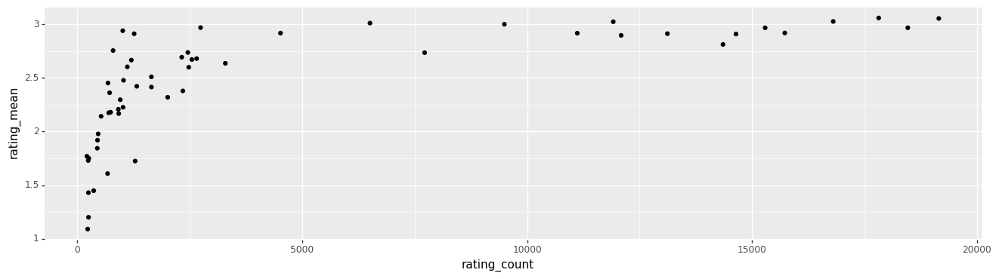

<ggplot: (708335213)>

In [55]:
(gg.ggplot(country_ratings, gg.aes(x='rating_count', y='rating_mean')) 
    + gg.geom_point() 
    + gg.theme(figure_size=(16, 4)))

## Player Throw & Stone Position
- Eriksson - 237
- Marks - 892
- Sturmay - 894

In [66]:
# Select all player throws and stone position where the stone remains on the ice and is properly recognized
player_throw_query = """
SELECT frames.abbrev, 
       frames.start_time, 
       frames.type, 
       frames.num, 
       frames.frame_num, 
       throws.name, 
       throws.team, 
       throws.sex, 
       throws.player_id,
       throws.colour, 
       throws.type, 
       throws.rating, 
       frames.x, 
       frames.y, 
       strftime('%Y', frames.start_time), 
       strftime('%m', frames.start_time)
FROM
(SELECT s.x,
        s.y,
        p.frame_num, 
        e1.num,
        p.position_id,
        e1.end_id,
        m1.type,
        MIN(s.size) as size,
        m1.start_time,
        e2.abbrev
FROM Stone s
JOIN Position p
  ON s.position_id = p.position_id
JOIN End e1
  ON p.end_id = e1.end_id
JOIN Match m1
  ON e1.match_id = m1.match_id
JOIN Event e2
  ON m1.event_id = e2.event_id
GROUP BY 5
) frames
LEFT JOIN
(SELECT t.throw_num, 
        t.colour, 
        p.player_id,
        p.name, 
        p.team, 
        p.sex,
        t.type, 
        t.rating, 
        e1.num,
        e1.end_id
FROM Throw t
JOIN Player p
  ON t.player_id = p.player_id
JOIN End e1
  ON t.end_id = e1.end_id
JOIN Match m1
  ON e1.match_id = m1.match_id
JOIN Event e2
  ON m1.event_id = e2.event_id
) throws
  ON frames.frame_num = throws.throw_num AND frames.end_id = throws.end_id
WHERE frames.size = 40 or frames.size = 46
"""
# Get data
db.execute_query(player_throw_query)
player_throws_sp = pd.DataFrame(db.cursor.fetchall(), columns=['tournament', 'start_time', 'match_type', 'end_num', 'frame_num', 'player', 'team', 'sex', 'player_id', 'colour', 'throw_type', 'rating', 'x', 'y', 'year', 'month']).dropna()

# Format
player_throws_sp['start_time'] = pd.to_datetime(player_throws_sp.start_time)
for col in ['tournament', 'match_type', 'team', 'sex', 'colour', 'throw_type']:
  player_throws_sp[col] = pd.Categorical(player_throws_sp[col])
player_throws_sp = player_throws_sp.astype({'player_id': 'int32', 'rating': 'int32', 'year': 'int32', 'month': 'int32'})

print(player_throws_sp.shape)
player_throws_sp.head()

(207720, 16)


,tournament,start_time,match_type,end_num,frame_num,player,team,sex,player_id,colour,throw_type,rating,x,y,year,month
0,CUR_PACC2017B,2017-11-04 19:00:00,Womens_Teams,1,2,THOMPSON H,NZL,f,2,red,Front,2,1.757926,1.245658,2017,11
1,CUR_PACC2017B,2017-11-04 19:00:00,Womens_Teams,1,3,FREDERICKS ARMSTR.,AUS,f,1,yellow,Draw,3,0.117932,-1.370961,2017,11
2,CUR_PACC2017B,2017-11-04 19:00:00,Womens_Teams,1,4,THOMPSON H,NZL,f,2,red,Draw,4,0.644941,0.796042,2017,11
3,CUR_PACC2017B,2017-11-04 19:00:00,Womens_Teams,1,6,JEYARANJAN T,NZL,f,4,red,Draw,0,1.496264,-1.415186,2017,11
4,CUR_PACC2017B,2017-11-04 19:00:00,Womens_Teams,1,7,POWELL A,AUS,f,3,yellow,Draw,0,-0.173213,1.982734,2017,11


### Utilities

In [119]:
def remove_misread(df: pd.DataFrame) -> pd.DataFrame:
    return df.query('rating != -1')

throws = {'Clearing': 'Clear/TO', 'Double Take-out': 'Clear/TO', 'Draw': 'Draw', 'Freeze': 'Guard', 'Front': 'Guard', 'Guard': 'Guard', 'Hit and Roll': 'Clear/TO', 
          'Promotion Take-out': 'Clear/TO', 'Raise': 'Misc', 'Take-out': 'Clear/TO', 'Through': 'Through', 'Wick / Soft Peeling': 'Misc', 'no statistics': 'No Stats'}

### Filter to Players of Interest, Create throw class

In [121]:
throw_interest = player_throws_sp.query('(player_id == 892) | (player_id == 894) | (player_id == 237)')
throw_interest['throw_class'] = throw_interest['throw_type'].apply(lambda x: throws[x])
print(throw_interest.shape)
throw_interest.head()

(1643, 17)


/var/folders/zz/z3rhbf4x4hdb8gwyxnpw92_40000gn/T/ipykernel_88522/3562790295.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,tournament,start_time,match_type,end_num,frame_num,player,team,sex,player_id,colour,throw_type,rating,x,y,year,month,throw_class
24582,CUR_WMDCC2019P,2019-04-25 16:00:00,Mixed_Doubles,1,4,ERIKSSON O,SWE,m,237,red,Draw,3,0.029483,0.486470,2019,4,Draw
24584,CUR_WMDCC2019P,2019-04-25 16:00:00,Mixed_Doubles,1,6,ERIKSSON O,SWE,m,237,red,Draw,4,-0.158471,0.051595,2019,4,Draw
24586,CUR_WMDCC2019P,2019-04-25 16:00:00,Mixed_Doubles,1,8,ERIKSSON O,SWE,m,237,red,Guard,4,-0.600717,2.329160,2019,4,Guard
24590,CUR_WMDCC2019P,2019-04-25 16:00:00,Mixed_Doubles,2,3,ERIKSSON O,SWE,m,237,yellow,Raise,4,0.003685,0.213752,2019,4,Misc
24592,CUR_WMDCC2019P,2019-04-25 16:00:00,Mixed_Doubles,2,5,ERIKSSON O,SWE,m,237,yellow,Draw,4,0.025798,1.002423,2019,4,Draw


/Users/lucasnieuwenhout/miniforge3/envs/env_curling/lib/python3.9/site-packages/plotnine/scales/scale_size.py:48: PlotnineWarning: Using size for a discrete variable is not advised.
/Users/lucasnieuwenhout/miniforge3/envs/env_curling/lib/python3.9/site-packages/plotnine/scales/scale.py:102: PlotnineWarning: scale_size_discrete could not recognise parameter `values`


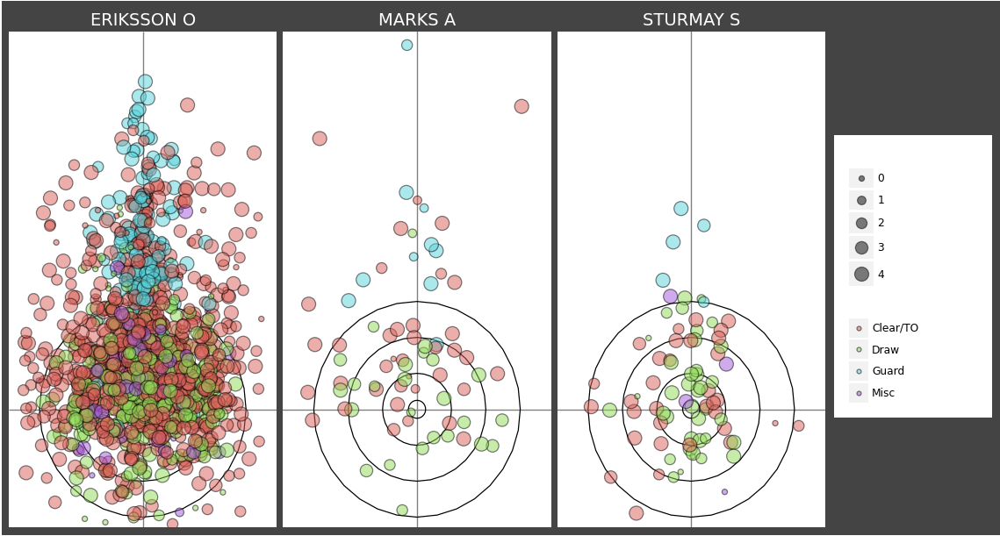

<ggplot: (698637960)>

In [123]:
size=4
(gg.ggplot(remove_misread(throw_interest), gg.aes(x='x', y='y', fill='factor(throw_class)', size='factor(rating)'))
    + gg.annotate(geom='path', x=circles[0] * circle_range_x, y=circles[0] * circle_range_y)
    + gg.annotate(geom='path', x=circles[1] * circle_range_x, y=circles[1] * circle_range_y)
    + gg.annotate(geom='path', x=circles[2] * circle_range_x, y=circles[2] * circle_range_y)
    + gg.annotate(geom='path', x=circles[3] * circle_range_x, y=circles[3] * circle_range_y)

    + gg.geom_point(alpha=0.5)

    + gg.facet_grid('. ~ player')

    + gg.scale_x_continuous(limits=ice_width, expand=(0, 0), breaks=lambda x: [0])
    + gg.scale_y_continuous(limits=ice_length, expand=(0, 0), breaks=lambda x: [0])
    # + gg.scale_fill_manual(values=['red', 'yellow'], guide=False)
    + gg.scale_size_discrete(values=[2, 4, 6, 8, 10])

    + gg.theme(figure_size=(size * 3, size * ((800 + 300)/(600))))
    + gg.theme(panel_grid=gg.element_line(colour='gray'))
    + gg.theme(text=gg.element_text(colour='white'))
    + gg.theme(axis_text=blank, axis_title_x=blank, axis_title_y=blank)
    + gg.theme(strip_text=gg.element_text(size=14), strip_background=blank, legend_text=gg.element_text(colour='black'))

    + pe.background_colour(panel_colour='#FFFFFF', plot_colour='#444444')
    + pe.remove_grid(minor=True)
    + pe.remove_ticks(minor=True, major=True)
    )

### Rating by Tournament

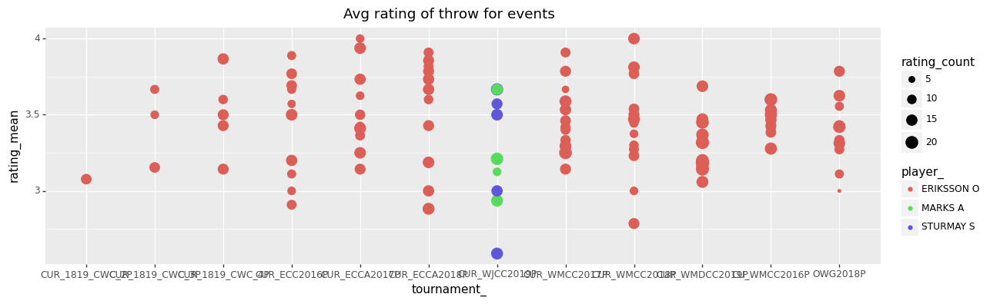

<ggplot: (765566684)>

In [128]:
throw_interest_event = throw_interest.groupby(['tournament', 'start_time', 'player']).agg({'rating':[('mean', 'mean'), ('count', 'count')]}).reset_index()
throw_interest_event.columns = ['_'.join(col) for col in throw_interest_event.columns.values]
(gg.ggplot(throw_interest_event.query('rating_mean > 0').sort_values('start_time_'), gg.aes(x='tournament_', y='rating_mean', size='rating_count', colour='player_')) 
    + gg.geom_point() 
    # + gg.scale_x_datetime()
    + pe.labels('Avg rating of throw for events')
    + gg.theme(figure_size=(14, 4))
    )

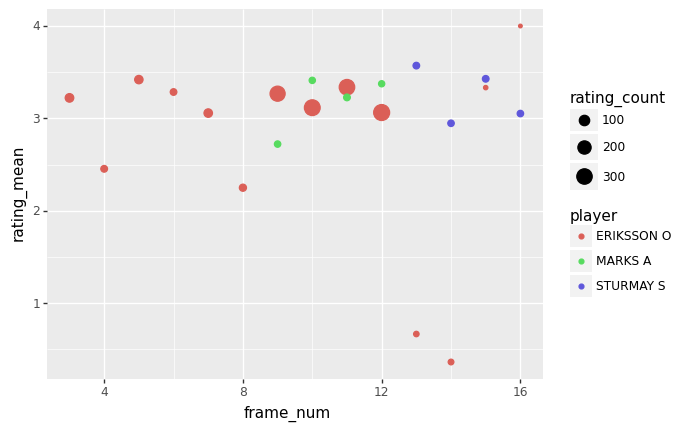

<ggplot: (776673166)>

In [137]:
throw_interest_throw = throw_interest.groupby(['frame_num', 'player']).agg({'rating': ['mean', 'count']})
throw_interest_throw.columns = ['_'.join(col) for col in throw_interest_throw.columns.values]
throw_interest_throw.reset_index()
gg.ggplot(throw_interest_throw.reset_index(), gg.aes(x='frame_num', y='rating_mean', size='rating_count', colour='player')) + gg.geom_point()

/Users/lucasnieuwenhout/miniforge3/envs/env_curling/lib/python3.9/site-packages/plotnine/layer.py:411: PlotnineWarning: geom_point : Removed 12 rows containing missing values.


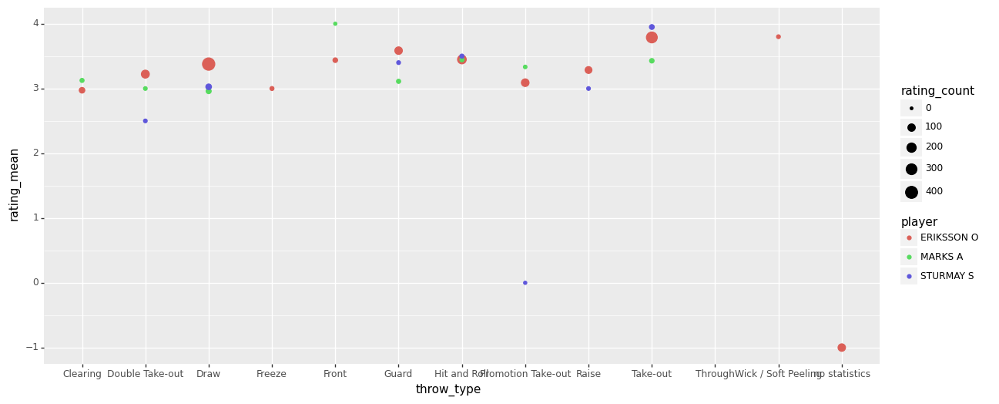

<ggplot: (702057548)>

In [140]:
throw_interest_type = throw_interest.groupby(['throw_type', 'player']).agg({'rating':[('mean', 'mean'), ('count', 'count')]})
throw_interest_type.columns = ['_'.join(col) for col in throw_interest_type.columns.values]
(gg.ggplot(throw_interest_type.reset_index(), gg.aes(x='throw_type', y='rating_mean', size='rating_count', colour='player')) 
    + gg.geom_point() 
    + gg.theme(figure_size=(14, 6))
    )

In [55]:
eriksson_type.reset_index().melt(id_vars='throw_type', value_vars=['rating_mean'])

,throw_type,variable,value
0,Clearing,rating_mean,3.833811
1,Double Take-out,rating_mean,3.120603
2,Draw,rating_mean,3.364865
3,Freeze,rating_mean,3.000000
4,Front,rating_mean,3.470588
5,Guard,rating_mean,3.558559
6,Hit and Roll,rating_mean,3.301075
7,Promotion Take-out,rating_mean,2.841379
8,Raise,rating_mean,3.207317
9,Take-out,rating_mean,3.614173


In [56]:
# Count of rating for throw count
# Average of the ratings
# eriksson_type_count = eriksson.groupby(['throw_type', 'rating']).agg({'name':'count'}).reset_index().pivot(index='throw_type', columns=['rating'])
eriksson_type_count = eriksson.groupby(['throw_type', 'rating']).agg({'name':'count'}).reset_index()
eriksson_type_count
pd.concat([eriksson_type_count, ])
# eriksson_type.join(eriksson_type_count)


,throw_type,rating,name
0,Clearing,-1,0
1,Clearing,0,5
2,Clearing,1,3
3,Clearing,2,14
4,Clearing,3,1
5,Clearing,4,326
6,Double Take-out,-1,0
7,Double Take-out,0,7
8,Double Take-out,1,0
9,Double Take-out,2,68


## End Scores

In [169]:
end_query = """
SELECT e.num, 
       e.hammer_colour, 
       e.direction, 
       e.team_1_final_score, 
       e.team_2_final_score,
       COALESCE(e.team_1_final_score - LAG(e.team_1_final_score, 1) OVER (PARTITION BY e.match_id ORDER BY e.num), e.team_1_final_score) as points_1,
       COALESCE(e.team_2_final_score - LAG(e.team_2_final_score, 1) OVER (PARTITION BY e.match_id ORDER BY e.num), e.team_2_final_score) as points_2,
       m.start_time,
       m.type,
       m.sheet,
       m.team_1_final_score,
       m.team_2_final_score,
       m.team_1,
       m.team_2,
       m.match_id
FROM End e
JOIN Match m
  ON e.match_id = m.match_id"""
db.execute_query(end_query)
end_df = pd.DataFrame(db.cursor.fetchall(), columns=['end_num', 'hammer_colour', 'direction', 't1e_score', 't2e_score', 't1e_points', 't2e_points', 'start_time', 'game_type', 'sheet', 't1m_score', 't2m_score', 'team_1', 'team_2', 'match_id'])

# Cleaning
end_df = end_df.query('(t1e_score != 99) & (t2e_score != 99) & (t1m_score != 99) & (t2m_score != 99)')
end_df['start_time'] = pd.to_datetime(end_df.start_time)
for col in ['hammer_colour', 'direction', 'game_type', 'sheet', 'team_1', 'team_2']:
    end_df[col] = pd.Categorical(end_df[col])

print(end_df.shape)
end_df.head(10)

(18148, 15)


,end_num,hammer_colour,direction,t1e_score,t2e_score,t1e_points,t2e_points,start_time,game_type,sheet,t1m_score,t2m_score,team_1,team_2,match_id
0,1,red,down,0,3,0,3,2017-11-04 19:00:00,Womens_Teams,D,7,6,NZL,AUS,1
1,2,yellow,up,1,3,1,0,2017-11-04 19:00:00,Womens_Teams,D,7,6,NZL,AUS,1
2,3,red,up,2,3,1,0,2017-11-04 19:00:00,Womens_Teams,D,7,6,NZL,AUS,1
3,4,yellow,down,3,3,1,0,2017-11-04 19:00:00,Womens_Teams,D,7,6,NZL,AUS,1
4,5,yellow,up,3,4,0,1,2017-11-04 19:00:00,Womens_Teams,D,7,6,NZL,AUS,1
5,6,yellow,up,5,4,2,0,2017-11-04 19:00:00,Womens_Teams,D,7,6,NZL,AUS,1
6,7,red,down,6,4,1,0,2017-11-04 19:00:00,Womens_Teams,D,7,6,NZL,AUS,1
7,8,yellow,down,6,5,0,1,2017-11-04 19:00:00,Womens_Teams,D,7,6,NZL,AUS,1
8,9,yellow,down,7,5,1,0,2017-11-04 19:00:00,Womens_Teams,D,7,6,NZL,AUS,1
9,10,red,up,7,6,0,1,2017-11-04 19:00:00,Womens_Teams,D,7,6,NZL,AUS,1


In [233]:
end_df['score_diff'] = end_df.eval('t1e_points - t2e_points').astype(np.float64)
end_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18148 entries, 0 to 18181
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   end_num        18148 non-null  int64         
 1   hammer_colour  18148 non-null  category      
 2   direction      18148 non-null  category      
 3   t1e_score      18148 non-null  int64         
 4   t2e_score      18148 non-null  int64         
 5   t1e_points     18148 non-null  int64         
 6   t2e_points     18148 non-null  int64         
 7   start_time     18148 non-null  datetime64[ns]
 8   game_type      18148 non-null  category      
 9   sheet          18148 non-null  category      
 10  t1m_score      18148 non-null  int64         
 11  t2m_score      18148 non-null  int64         
 12  team_1         18148 non-null  category      
 13  team_2         18148 non-null  category      
 14  match_id       18148 non-null  int64         
 15  score_diff     1814

/var/folders/zz/z3rhbf4x4hdb8gwyxnpw92_40000gn/T/ipykernel_88522/1191802334.py:1: FutureWarning: ['hammer_colour', 'direction', 'game_type', 'sheet', 'team_2'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.


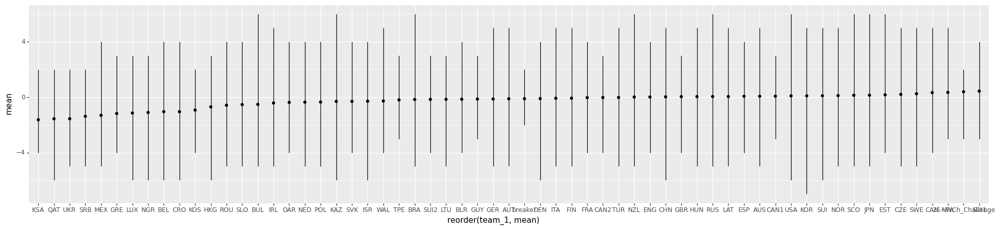

<ggplot: (697903065)>

In [264]:
gg.ggplot(end_df.groupby(['team_1']).agg(['min', 'count', 'max', 'mean']).score_diff.reset_index(), gg.aes(x='reorder(team_1, mean)', y='mean', ymin='min', ymax='max')) + gg.geom_point() + gg.theme(figure_size=(24, 5)) + gg.geom_linerange()

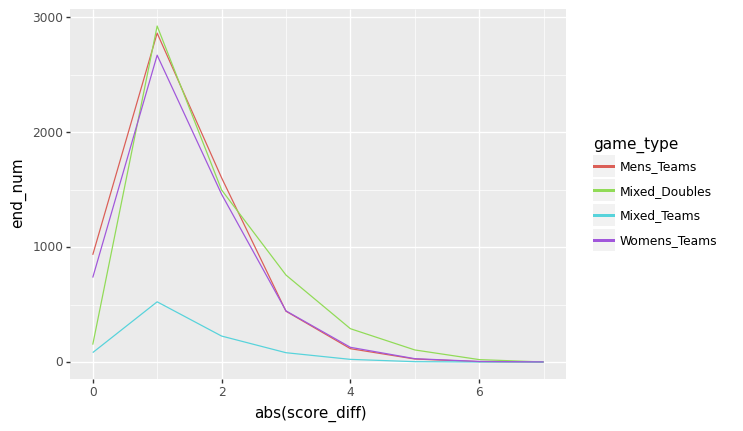

<ggplot: (773909694)>

In [228]:
gg.ggplot(end_df.groupby(['game_type', 'score_diff']).agg({'end_num': 'count'}).reset_index(), gg.aes(x='abs(score_diff)', y='end_num', colour='game_type')) + gg.geom_line()
# end_df.groupby(['score_diff']).agg({'end_num': 'count'}).reset_index()

/var/folders/zz/z3rhbf4x4hdb8gwyxnpw92_40000gn/T/ipykernel_88522/1659602164.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


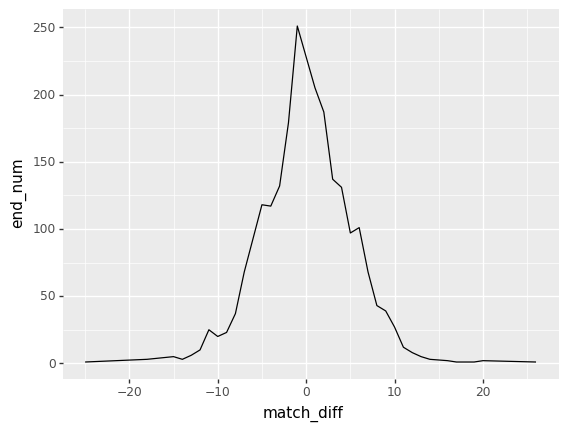

<ggplot: (703148189)>

In [237]:
matches = end_df.query('end_num == 1')
matches['match_diff'] = matches.eval('t1m_score - t2m_score')
gg.ggplot(matches.groupby(['match_diff']).agg({'end_num':'count'}).reset_index(), gg.aes(x='match_diff', y='end_num')) + gg.geom_line()

In [250]:
matches.groupby('team_1').agg(['min', 'mean', 'max', 'count']).reset_index().sort_values(('match_diff', 'mean'), ascending=False)

/var/folders/zz/z3rhbf4x4hdb8gwyxnpw92_40000gn/T/ipykernel_88522/1778826413.py:1: FutureWarning: ['hammer_colour', 'direction', 'game_type', 'sheet', 'team_2'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.


team_1 end_num                t1e_score                      \
                         min mean max count       min      mean max count   
0   25~WCh_Challenge       1  1.0   1     2         1  1.500000   2     2   
51              SUI1       1  1.0   1     3         0  1.333333   2     3   
7                CAN       1  1.0   1   135         0  0.822222   5   135   
40               NPA       1  1.0   1     5         1  1.400000   3     5   
54               SWE       1  1.0   1   146         0  0.726027   4   146   
12               CZE       1  1.0   1    53         0  0.603774   5    53   
16               EST       1  1.0   1    17         0  0.882353   2    17   
28               JPN       1  1.0   1    89         0  0.808989   5    89   
47               SCO       1  1.0   1   127         0  0.708661   5   127   
39               NOR       1  1.0   1   108         0  0.814815   5   108   
50               SUI       1  1.0   1   135         0  0.777778   4   135   
30               KOR       1  1.0   1   122         0  0.762295   4   122   
58               USA       1  1.0   1   129         0  0.790698   6   129   
8               CAN1       1  1.0   1     7         0  0.714286   2     7   
1                AUS       1  1.0   1    25         0  0.760000   3    25   
15               ESP       1  1.0   1    14         0  0.928571   2    14   
46               RUS       1  1.0   1   120         0  0.875000   6   120   
33               LAT       1  1.0   1    24         0  1.250000   5    24   
19               GBR       1  1.0   1    16         0  0.750000   3    16   
24               HUN       1  1.0   1    26         0  0.730769   4    26   
10               CHN       1  1.0   1   119         0  0.831933   4   119   
14               ENG       1  1.0   1    19         0  0.894737   3    19   
41               NZL       1  1.0   1    24         0  1.041667   6    24   
56               TUR       1  1.0   1    31         0  0.967742   5    31   
9               CAN2       1  1.0   1     5         0  0.800000   3     5   
18               FRA       1  1.0   1    13         0  0.923077   4    13   
17               FIN       1  1.0   1    58         0  0.603448   5    58   
27               ITA       1  1.0   1    88         0  0.386364   3    88   
2                AUT       1  1.0   1    24         0  0.708333   5    24   
13               DEN       1  1.0   1    73         0  0.561644   4    73   
60           breaker       1  1.0   1     1         0  0.000000   0     1   
22               GUY       1  1.0   1     6         0  1.000000   3     6   
4                BLR       1  1.0   1    13         0  0.538462   3    13   
20               GER       1  1.0   1    91         0  0.483516   3    91   
5                BRA       1  1.0   1    13         0  1.153846   4    13   
34               LTU       1  1.0   1     8         0  0.625000   2     8   
52              SUI2       1  1.0   1     3         0  0.666667   1     3   
55               TPE       1  1.0   1     8         0  0.875000   3     8   
59               WAL       1  1.0   1     9         0  0.777778   5     9   
26               ISR       1  1.0   1     9         0  1.111111   2     9   
29               KAZ       1  1.0   1    22         0  0.954545   5    22   
53               SVK       1  1.0   1    22         0  0.681818   4    22   
43               POL       1  1.0   1    18         0  0.611111   3    18   
25               IRL       1  1.0   1    18         0  0.611111   3    18   
42               OAR       1  1.0   1     9         0  0.555556   4     9   
37               NED       1  1.0   1    37         0  0.486486   2    37   
6                BUL       1  1.0   1     7         0  0.857143   6     7   
48               SLO       1  1.0   1    14         0  0.928571   4    14   
45               ROU       1  1.0   1    13         0  0.307692   2    13   
23               HKG       1  1.0   1    15         0  0.600000   3    15   
31        

/var/folders/zz/z3rhbf4x4hdb8gwyxnpw92_40000gn/T/ipykernel_88522/164750789.py:1: FutureWarning: ['hammer_colour', 'direction', 'game_type', 'sheet', 'team_2'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.


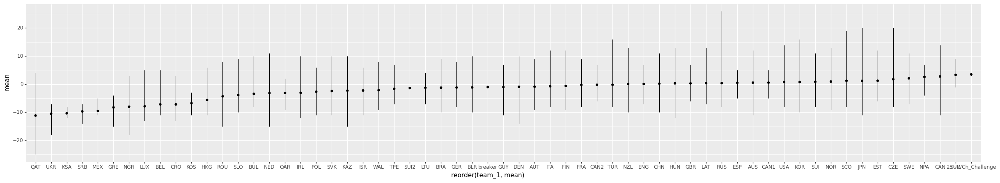

<ggplot: (778466672)>

In [267]:
gg.ggplot(matches.groupby(['team_1']).agg(['min', 'count', 'max', 'mean']).match_diff.reset_index(), gg.aes(x='reorder(team_1, mean)', y='mean', ymin='min', ymax='max')) + gg.geom_point() + gg.theme(figure_size=(30, 5)) + gg.geom_linerange()